**EDA Part 2**

- Using GeoPandas plotting functionality to visualise distribution of predictor variables

In [ ]:
# latest_df = gpd.read_file('../../../../big_files/latest_df.shp')


In [2]:
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('whitegrid')
import pandas as pd

In [4]:
# import shape files for plotting London neighbourhoods

boroughs = gpd.read_file('../big_files/London_Borough_Excluding_MHW.dbf')
ward = gpd.read_file('../big_files/London_Ward_CityMerged.shp')
lsoa = gpd.read_file('../big_files/LSOA_2011_London_gen_MHW.shp')
ward_lsoa = gpd.read_file('../big_files/ward_lsoa.shp')

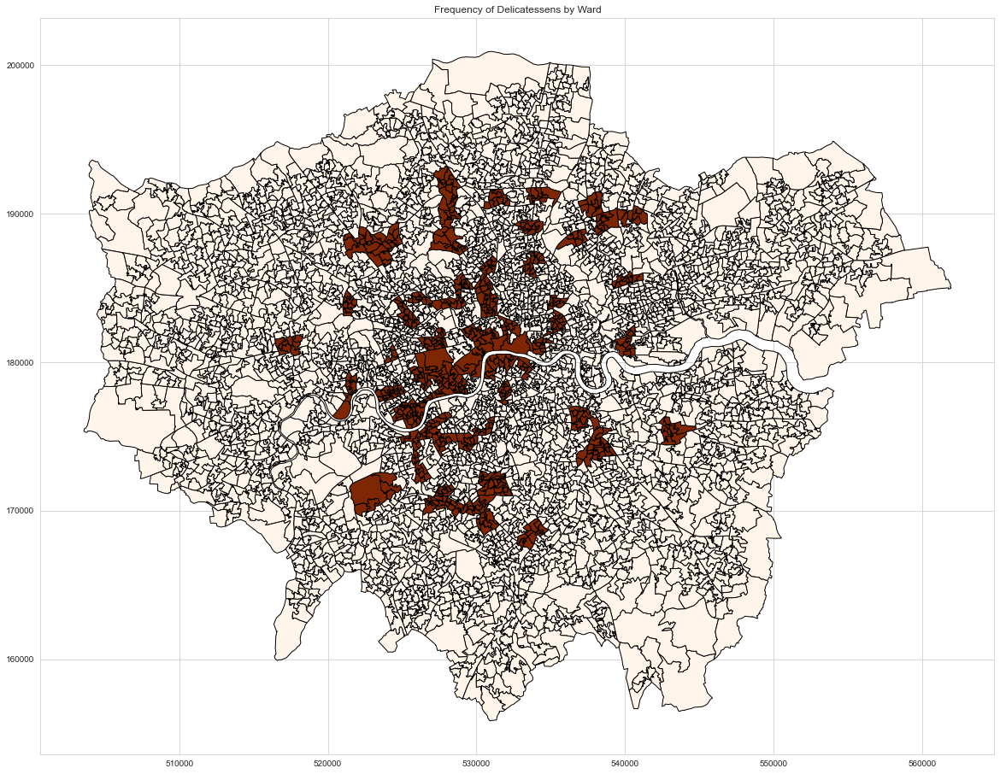

In [6]:
#import delicatessen data, merge with shape file, and plot

grouped_delis = pd.read_csv('../big_files/grouped_delis.csv')
grouped_delis = grouped_delis.drop(columns = ['Unnamed: 0'])
deli_wards = pd.merge(ward_lsoa, grouped_delis, how = 'left', left_on = 'ward_code', right_on = 'ward_code')
deli_wards = deli_wards.drop_duplicates(subset = ['ward_code', 'geometry'])
deli_wards = deli_wards.dropna()
fig, ax = plt.subplots(figsize = (20, 20))
deli_wards.plot(column = 'deli_count', cmap = 'Oranges', ax = ax, edgecolor = 'black')
plt.title('Frequency of Delicatessens by Ward')
plt.show()

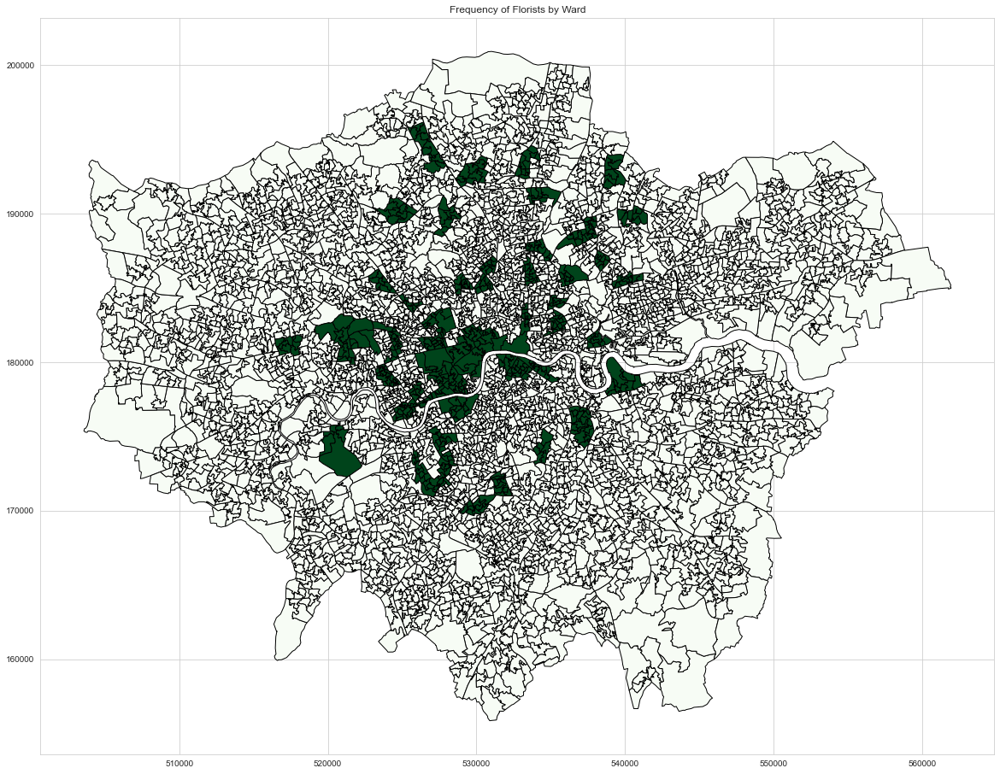

In [7]:
#import florist data, merge with shape file, and plot

grouped_florists = pd.read_csv('../big_files/grouped_florists.csv')
grouped_florists = grouped_florists.drop(columns = ['Unnamed: 0'])
florist_wards = pd.merge(ward_lsoa, grouped_florists, how = 'left', left_on = 'ward_code', right_on = 'ward_code')
florist_wards = florist_wards.drop_duplicates(subset = ['ward_code', 'geometry'])
florist_wards = florist_wards.dropna()
fig, ax = plt.subplots(figsize = (20, 20))
florist_wards.plot(column = 'florist_count', cmap = 'Greens', ax = ax, edgecolor = 'black')
plt.title('Frequency of Florists by Ward')
plt.show()

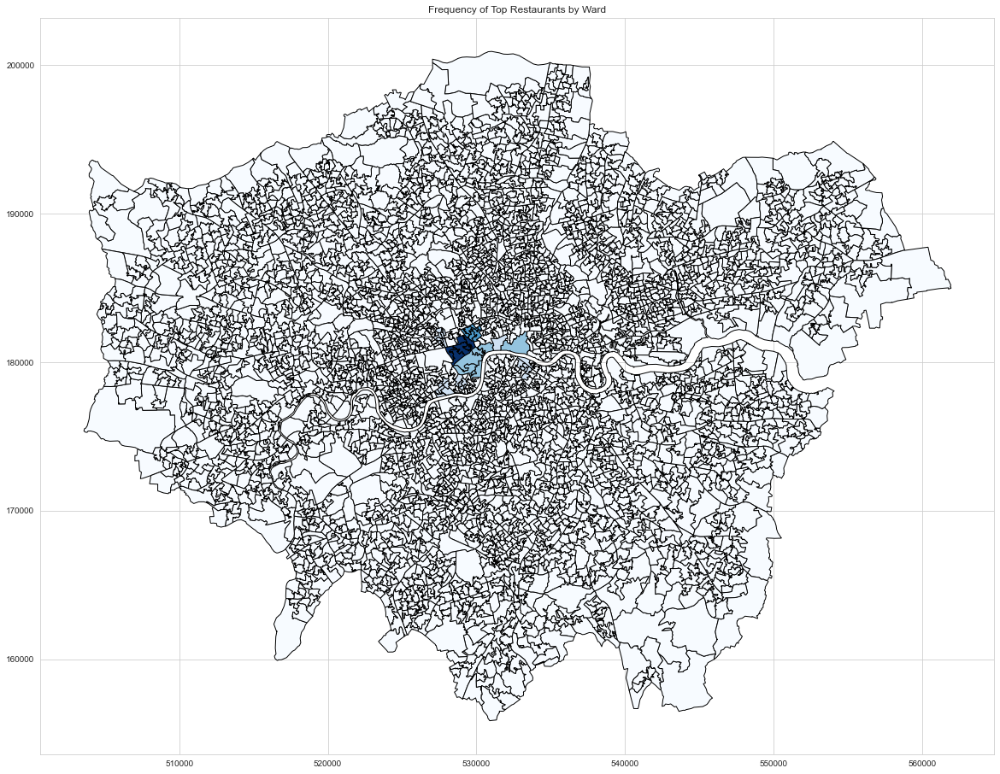

In [8]:
#import restaurant data, merge with shape file, and plot

grouped_restaurants = pd.read_csv('../big_files/grouped_restaurants.csv')
grouped_restaurants = grouped_restaurants.drop(columns = ['Unnamed: 0'])
restaurant_wards = pd.merge(ward_lsoa, grouped_restaurants, how = 'left', left_on = 'ward_code', right_on = 'ward_code')
restaurant_wards = restaurant_wards.drop_duplicates(subset = ['ward_code', 'geometry'])
restaurant_wards = restaurant_wards.dropna()
fig, ax = plt.subplots(figsize = (20, 20))
restaurant_wards.plot(column = 'restaurant_count', cmap = 'Blues', ax = ax, edgecolor = 'black')
plt.title('Frequency of Top Restaurants by Ward')
plt.show()

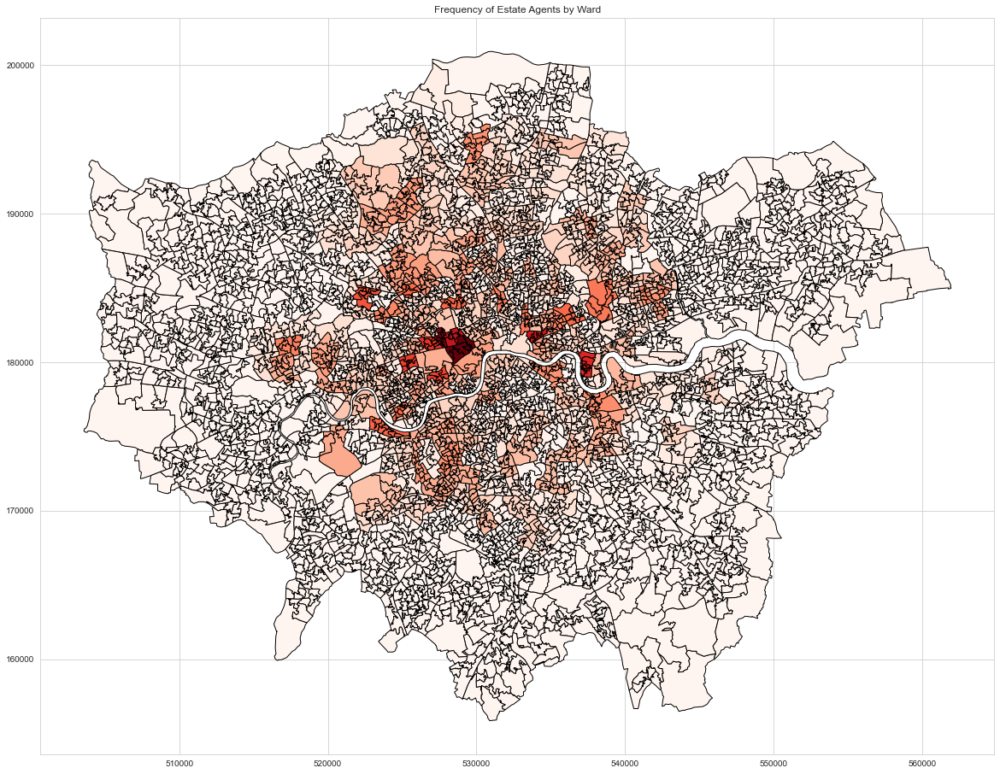

In [10]:
#import estate agent data, merge with shape file, and plot

ea_wards = pd.read_csv('../big_files/ea_wards.csv')
ea_wards = ea_wards.drop(columns = ['Unnamed: 0'])
ea_wards_count = pd.merge(ward_lsoa, ea_wards, how = 'left', left_on = 'ward_code', right_on = 'ward_code')
ea_wards_count['ea_count'] = ea_wards_count['ea_count'].fillna(0)
fig, ax = plt.subplots(figsize = (20, 20))
ea_wards_count.plot(column = 'ea_count', cmap = 'Reds', ax = ax, edgecolor = 'black')
plt.title('Frequency of Estate Agents by Ward')
plt.show()

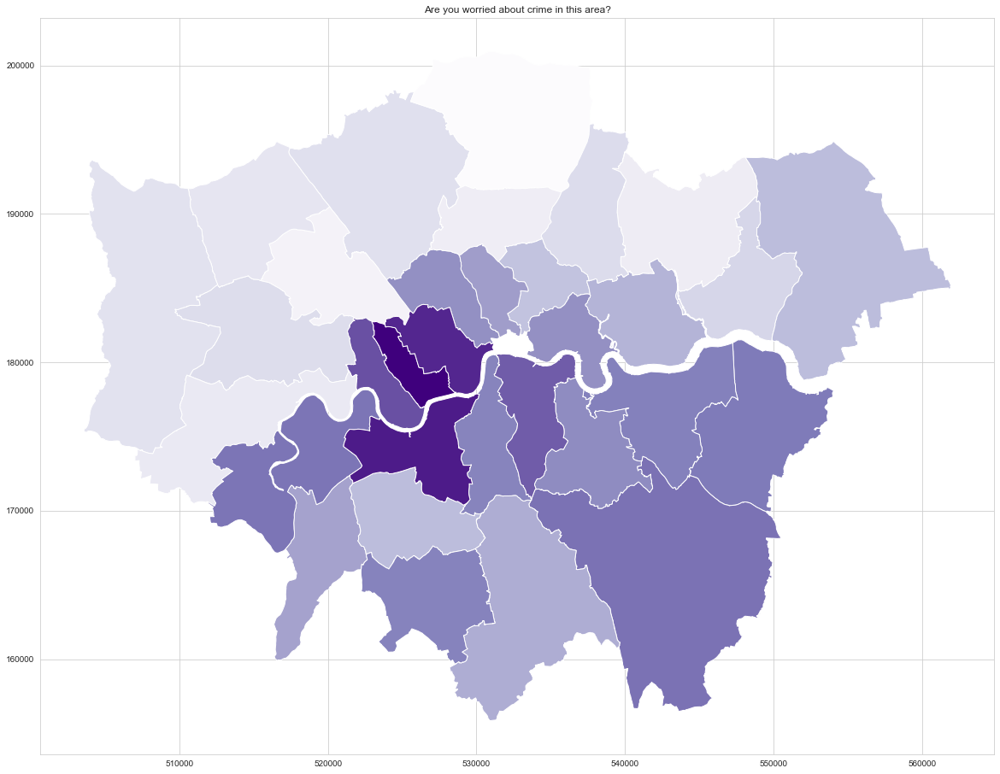

In [11]:
# import crime survey data, merge with shape files and plot

borough_crime_perception = pd.read_csv('../big_files/borough_perceptions.csv')
borough_crime_perception = borough_crime_perception.drop(columns = ['Unnamed: 0'])
boroughs = boroughs.rename(columns = {'NAME': 'borough_name'})
borough_crime_perception = pd.merge(borough_crime_perception, boroughs, on = 'borough_name')
borough_crime_perception_gdf = gpd.GeoDataFrame(borough_crime_perception, geometry = borough_crime_perception['geometry'])
fig, ax = plt.subplots(figsize = (20,20))
borough_crime_perception_gdf.plot(column = 'Are you worried about crime in this area?', ax = ax, cmap = 'Purples')
plt.title('Are you worried about crime in this area?')
plt.show()

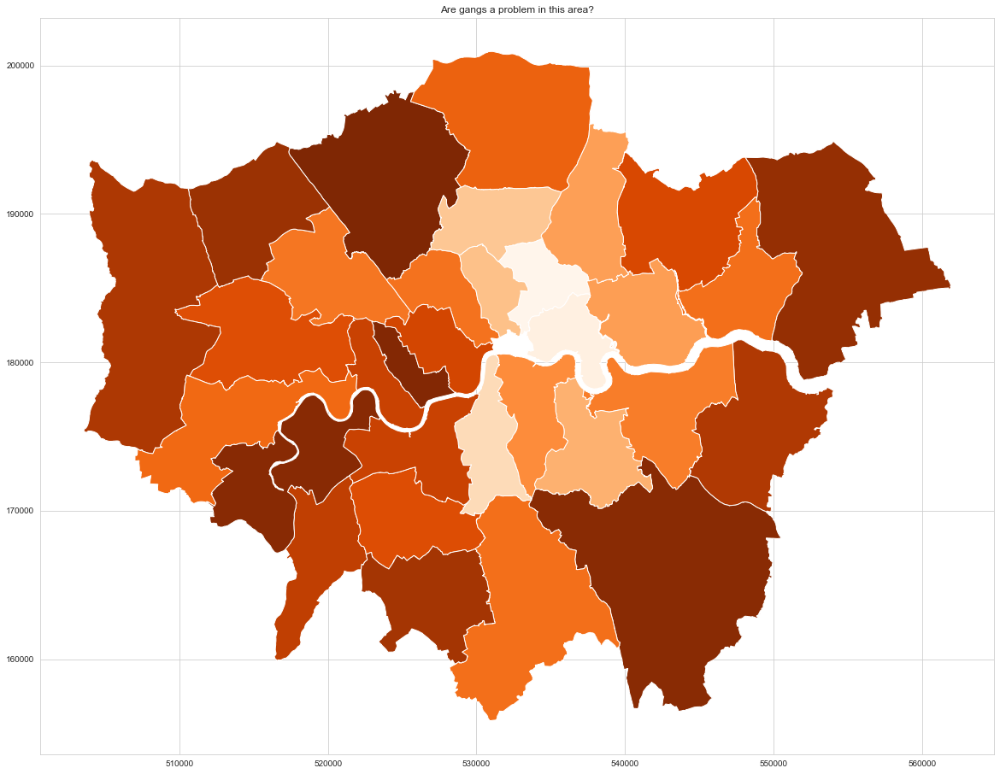

In [76]:
fig, ax = plt.subplots(figsize = (20,20))
borough_crime_perception_gdf.plot(column = 'Are gangs a problem in this area?', ax = ax, cmap = 'Oranges')
plt.title('Are gangs a problem in this area?')
plt.show()

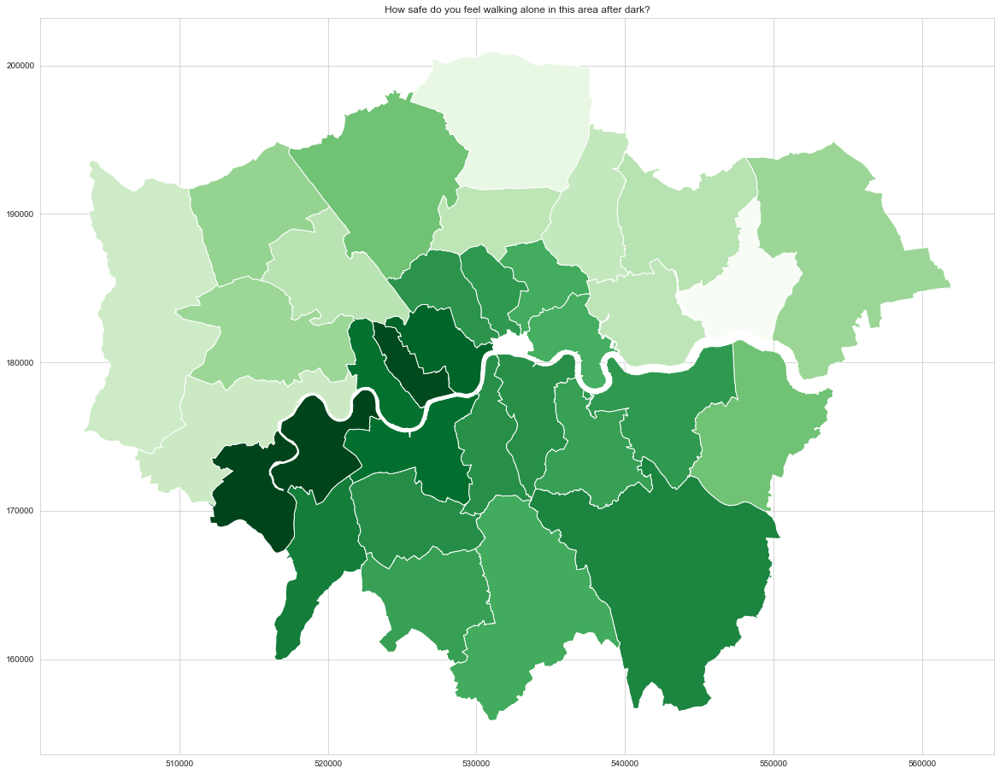

In [55]:
fig, ax = plt.subplots(figsize = (20,20))
borough_crime_perception_gdf.plot(column = 'How safe do you feel walking alone in this area after dark?', ax = ax, cmap = 'Greens')
plt.title('How safe do you feel walking alone in this area after dark?')
plt.show()

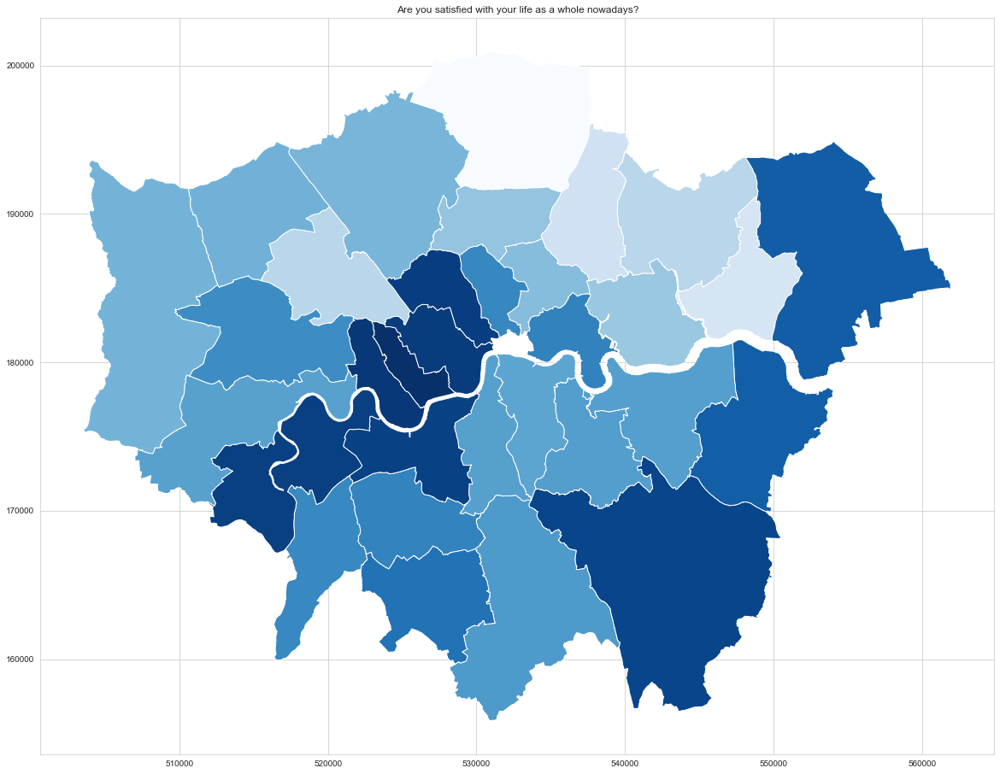

In [54]:
fig, ax = plt.subplots(figsize = (20,20))
borough_crime_perception_gdf.plot(column = 'Are you satisfied with your life as a whole nowadays?', ax = ax, cmap = 'Blues')
plt.title('Are you satisfied with your life as a whole nowadays?')
plt.show()

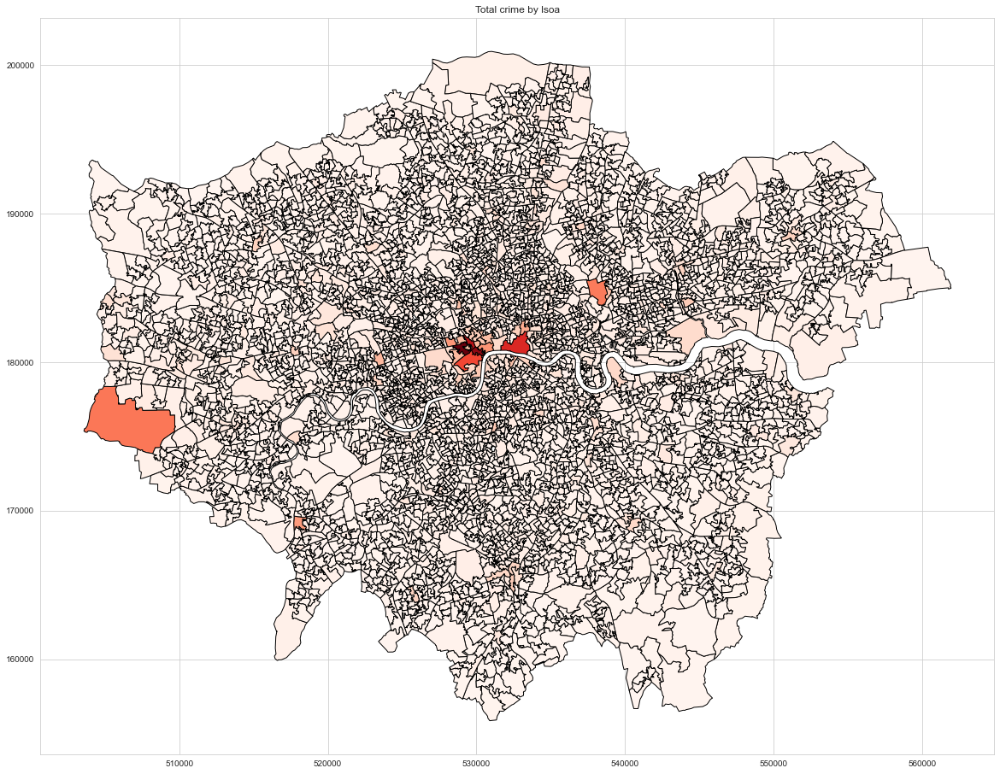

In [12]:
# import police crime data, merge with shape files and plot
# note Heathrow airport, West End, Hackney/Newham

grouped_crime = pd.read_csv('../big_files/grouped_crime.csv')
grouped_crime = grouped_crime.drop(columns = ['Unnamed: 0'])
grouped_crime_lsoa = pd.merge(lsoa, grouped_crime, how = 'left', left_on = 'LSOA11CD', right_on = 'lsoa')
fig, ax = plt.subplots(figsize = (20,20))
grouped_crime_lsoa.plot(column = 'crime_count_lsoa', ax = ax, cmap = 'Reds', edgecolor = 'black')
plt.title('Total crime by lsoa')
plt.show()

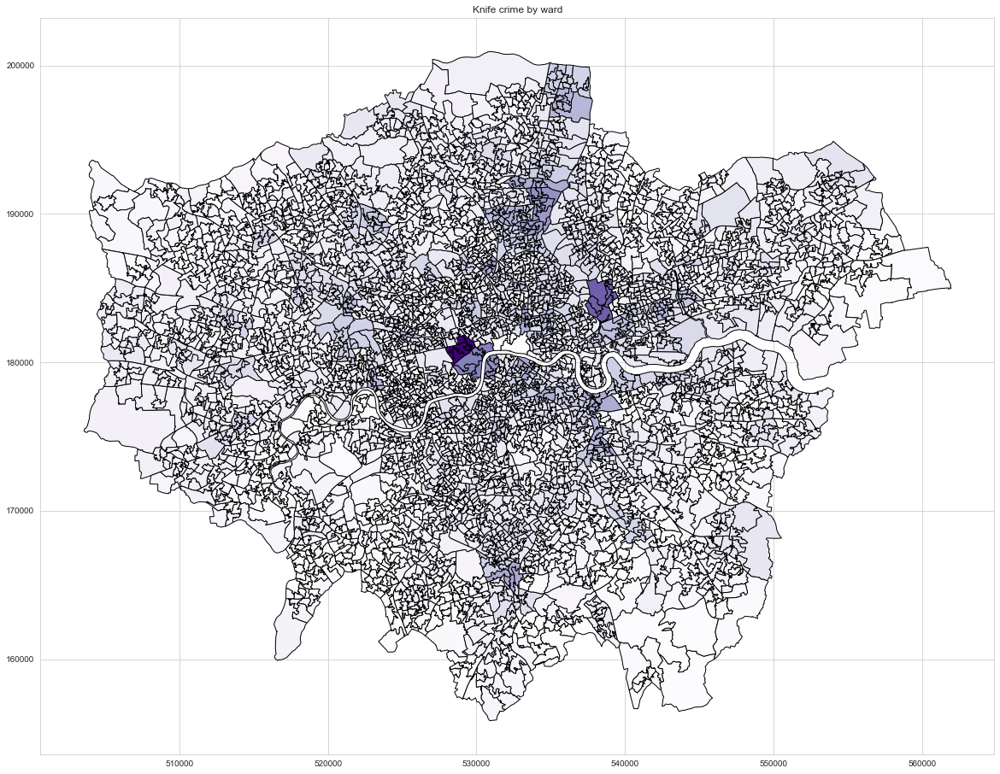

In [13]:
# import knife crime data, merge with shape file and plot

knife = pd.read_csv('../big_files/knife.csv')
knife_ward = pd.merge(ward_lsoa, knife, how = 'left', left_on = 'ward_code', right_on = 'ward_code')
knife_ward = knife_ward.drop_duplicates(subset = ['ward_code', 'total_knife_crimes', 'geometry'])
knife_ward['perc_total_knife'] = knife_ward['perc_total_knife'].fillna(0)
knife_ward['total_knife_crimes'] = knife_ward['total_knife_crimes'].fillna(0)
knife_ward = knife_ward.dropna()
fig, ax = plt.subplots(figsize = (20,20))
boroughs.plot(ax = ax, edgecolor = 'white')
knife_ward.plot(column = 'total_knife_crimes', ax = ax, cmap = 'Purples', edgecolor = 'black')
plt.title('Knife crime by ward')
plt.show()

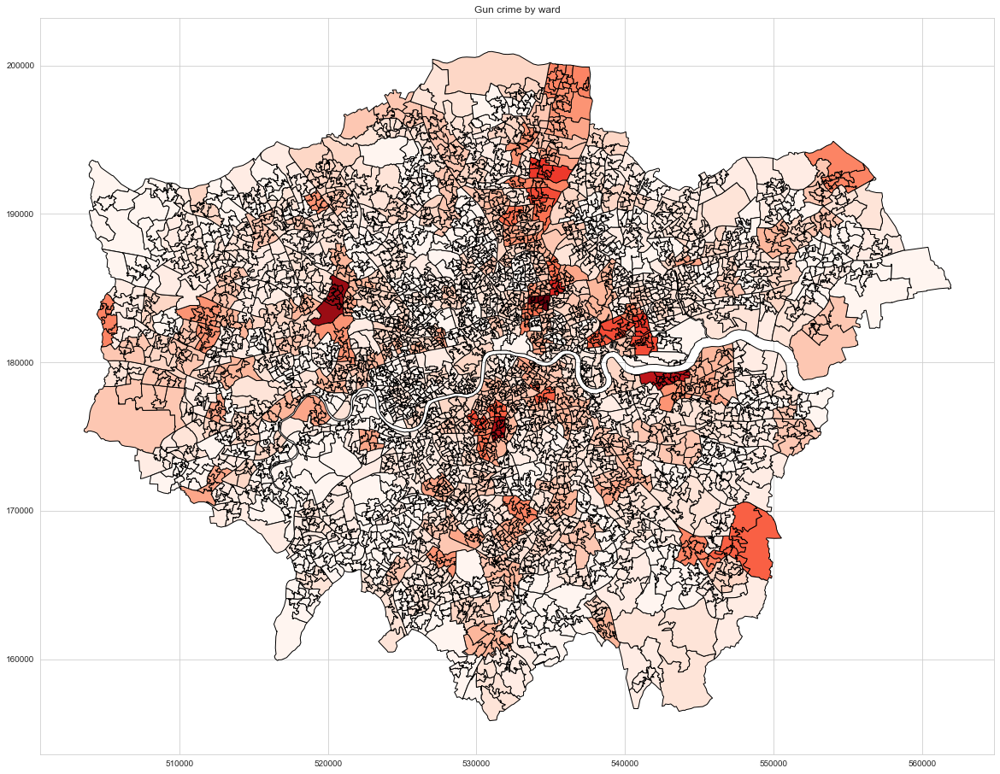

In [14]:
# import gun crime data, merge with shape file and plot

gun = pd.read_csv('../big_files/gun.csv')
gun_ward = pd.merge(ward_lsoa, gun, how = 'left', left_on = 'ward_code', right_on = 'ward_code')
gun_ward = gun_ward.drop_duplicates(subset = ['ward_code', 'total_gun_crimes', 'geometry'])
gun_ward['perc_total_gun'] = gun_ward['perc_total_gun'].fillna(0)
gun_ward['total_gun_crimes'] = gun_ward['total_gun_crimes'].fillna(0)
gun_ward = gun_ward.dropna()
fig, ax = plt.subplots(figsize = (20,20))
boroughs.plot(ax = ax, edgecolor = 'white')
gun_ward.plot(column = 'total_gun_crimes', ax = ax, cmap = 'Reds', edgecolor = 'black')
plt.title('Gun crime by ward')
plt.show()

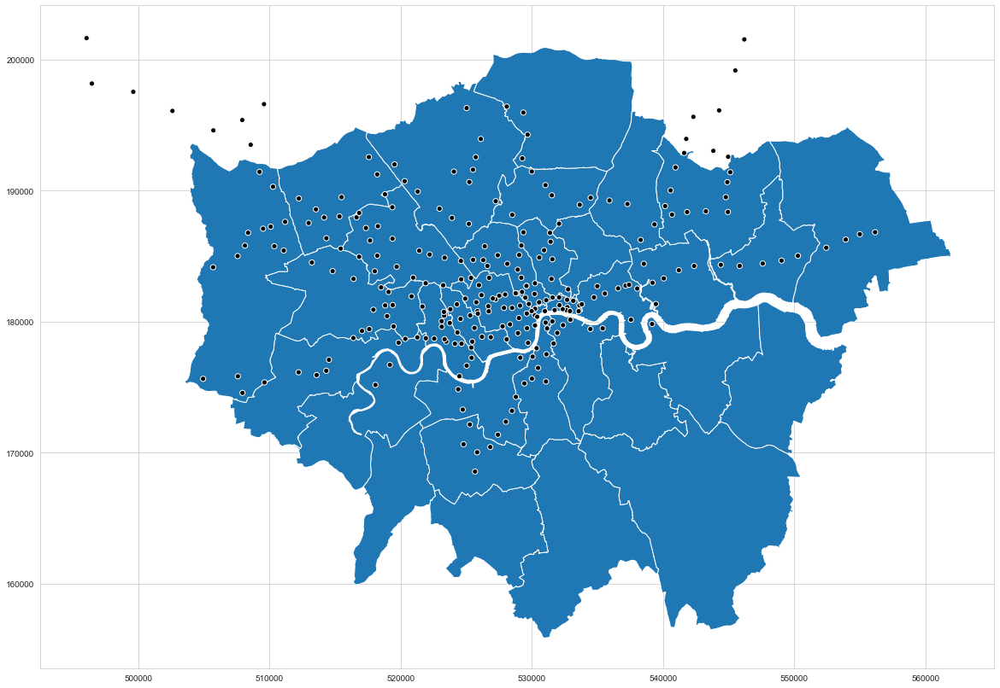

In [15]:
# import tube data and plot 200m radius around each stop

tubes_2400m = gpd.read_file('../big_files/tubes2400m.shp')
tubes_1600m = gpd.read_file('../big_files/tubes1600m.shp')
tubes_800m = gpd.read_file('../big_files/tubes800m.shp')
tubes_400m = gpd.read_file('../big_files/tubes400m.shp')
tubes_200m = gpd.read_file('../big_files/tubes200m.shp')
tubes_50m = gpd.read_file('../big_files/tubes50m.shp')

fig, ax = plt.subplots(figsize = (20,20))
boroughs.plot(ax = ax, edgecolor = 'white')
tubes_200m.plot(ax = ax, color = 'black')
plt.show()

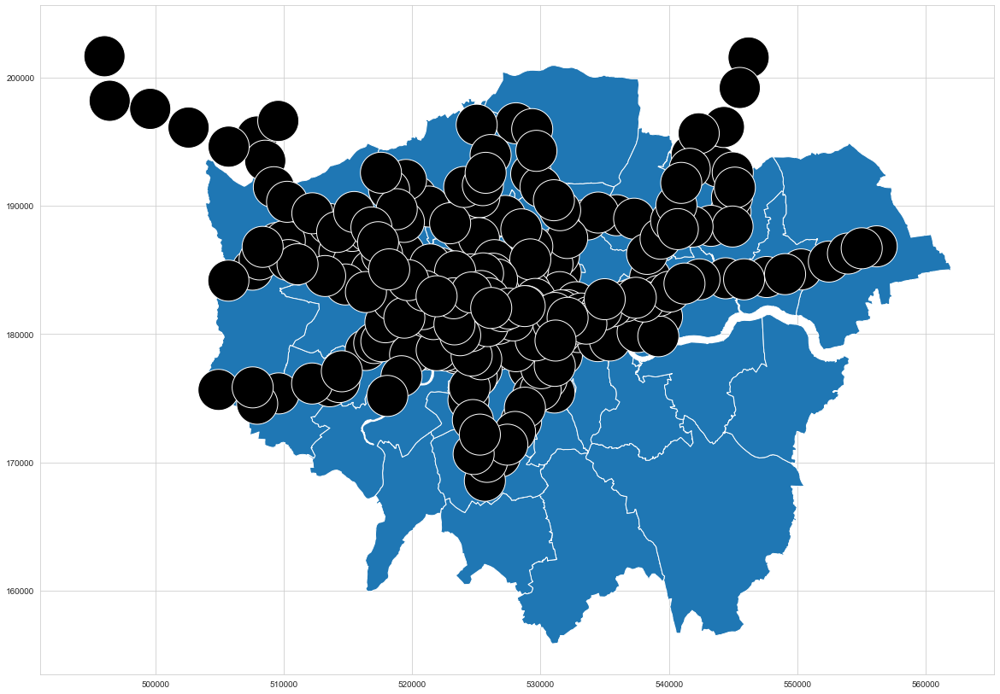

In [16]:
# plot 1 mile radius around each tube stop

fig, ax = plt.subplots(figsize = (20,20))
boroughs.plot(ax = ax, edgecolor = 'white')
tubes_1600m.plot(ax = ax, color = 'black')
plt.show()

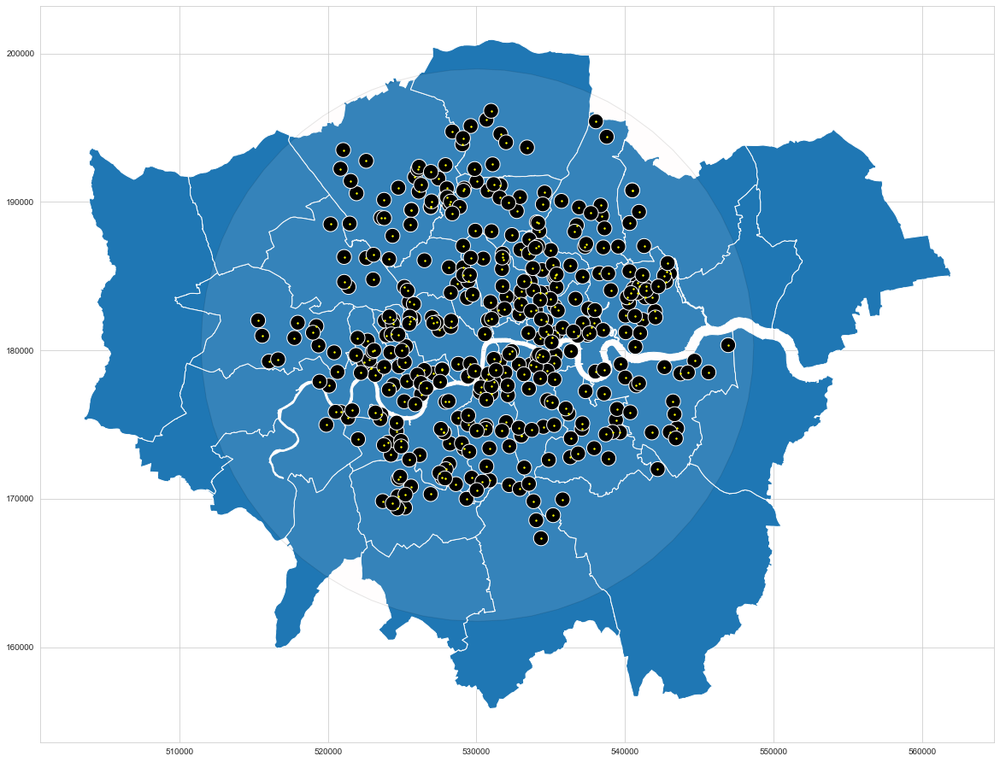

In [19]:
# import schools data, and plot 500m radius around outstanding schools
# central mask shows extend of London postcodes within Greater London

final_schools = gpd.read_file('../big_files/final_schools.shp')
schools_500m = gpd.read_file('../big_files/schools_500m.shp')
central_mask = gpd.read_file('../big_files/central_mask.shp')
fig, ax = plt.subplots(figsize = (20,20))
boroughs.plot(ax = ax, edgecolor = 'white')
central_mask.plot(ax = ax, cmap = 'Reds', edgecolor = 'black', alpha = 0.1)
schools_500m.plot(ax = ax, color = 'black')
final_schools.plot(ax = ax, color = 'yellow', markersize = 2)
plt.show()

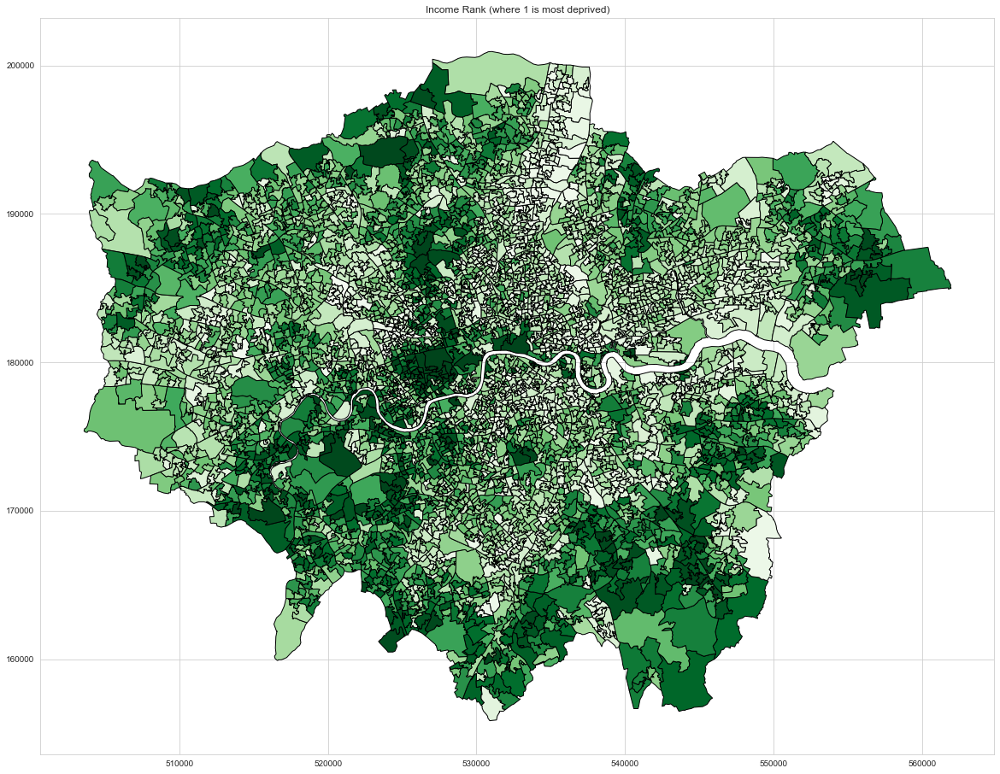

In [21]:
# import deprivation data, merge with shape file, and plot Income Rank

deprivation = pd.read_csv('../big_files/deprivation_clean.csv')
deprivation = deprivation.drop(columns = ['Unnamed: 0'])
deprivation_lsoa = pd.merge(lsoa, deprivation, how = 'left', left_on = 'LSOA11CD', right_on = 'lsoa')
fig, ax = plt.subplots(figsize = (20,20))
boroughs.plot(ax = ax, edgecolor = 'white')
deprivation_lsoa.plot(column = 'Income Rank (where 1 is most deprived)', ax = ax, cmap = 'Greens', edgecolor = 'black')
plt.title('Income Rank (where 1 is most deprived)')
plt.show()

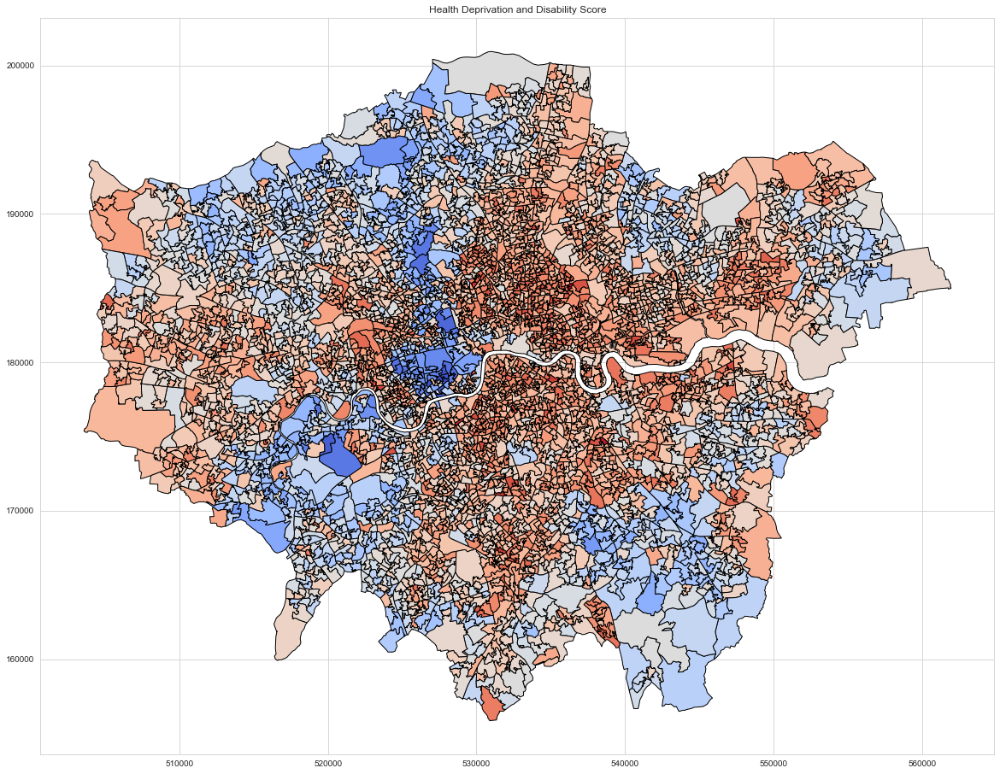

In [22]:
# plot health deprivation

fig, ax = plt.subplots(figsize = (20,20))
boroughs.plot(ax = ax, edgecolor = 'white')
deprivation_lsoa.plot(column = 'Health Deprivation and Disability Score', ax = ax, cmap = 'coolwarm', edgecolor = 'black')
plt.title('Health Deprivation and Disability Score')
plt.show()